### Datenanalyse

Dieses Dokument dient zur Einarbeitung in den Datensatz. Ziel ist es ein Verständnis der einzelnen Attribute zu erlangen und ein Gefühl für deren Zusammenspiel zu gewinnen. Weiterhin sollen fehlerhafte Daten identifiziert werden.

**Vorbereitung: Import benötigter Bibliotheken & Einlesen der Daten**

In [1]:
from pathlib import Path
from scipy import stats

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

np.set_printoptions(suppress=True)

pd.options.display.max_columns = None
pd.options.display.max_rows = None
pd.options.display.max_colwidth = None

from IPython.display import display

In [2]:
path1 = Path(r"A:\Workspace\Python\Masterarbeit\Kaggle Home Credit Datensatz")
path2 = Path(r"C:\Users\rober\Documents\Workspace\Python\Masterarbeit\Kaggle Home Credit Datensatz")

if path1.is_dir():
    DATASET_DIR = path1
else:
    DATASET_DIR = path2

In [3]:
app_test = pd.read_csv(DATASET_DIR / "application_test.csv")
app_train = pd.read_csv(DATASET_DIR / "application_train.csv")
bureau = pd.read_csv(DATASET_DIR / "bureau.csv")
bureau_balance = pd.read_csv(DATASET_DIR / "bureau_balance.csv")
credit_card_balance = pd.read_csv(DATASET_DIR / "credit_card_balance.csv")
installments_payments = pd.read_csv(DATASET_DIR / "installments_payments.csv")
pcb = pd.read_csv(DATASET_DIR / "POS_CASH_balance.csv")
previous_application = pd.read_csv(DATASET_DIR / "previous_application.csv")

description = pd.read_csv(DATASET_DIR / "HomeCredit_columns_description.csv", encoding="latin", index_col=0)

In [9]:
app_train.shape

(307511, 122)

**Beschreibungen der Attribute untergliedert nach den gegebenen CSV-Dateien**

In [ ]:
description.loc[description['Table']=="application_{train|test}.csv", "Row":"Special"]

In [5]:
description.loc[description['Table']=="bureau.csv", "Row":"Special"]

,Row,Description,Special
125,SK_ID_CURR,"ID of loan in our sample - one loan in our sample can have 0,1,2 or more related previous credits in credit bureau",hashed
126,SK_BUREAU_ID,Recoded ID of previous Credit Bureau credit related to our loan (unique coding for each loan application),hashed
127,CREDIT_ACTIVE,Status of the Credit Bureau (CB) reported credits,NaN
128,CREDIT_CURRENCY,Recoded currency of the Credit Bureau credit,recoded
129,DAYS_CREDIT,How many days before current application did client apply for Credit Bureau credit,time only relative to the application
130,CREDIT_DAY_OVERDUE,Number of days past due on CB credit at the time of application for related loan in our sample,NaN
131,DAYS_CREDIT_ENDDATE,Remaining duration of CB credit (in days) at the time of application in Home Credit,time only relative to the application
132,DAYS_ENDDATE_FACT,Days since CB credit ended at the time of application in Home Credit (only for closed credit),time only relative to the application
133,AMT_CREDIT_MAX_OVERDUE,Maximal amount overdue on the Credit Bureau credit so far (at application date of loan in our sample),NaN
134,CNT_CREDIT_PROLONG,How many times was the Credit Bureau credit prolonged,NaN


In [6]:
description.loc[description['Table']=="bureau_balance.csv", "Row":"Special"]

,Row,Description,Special
142,SK_BUREAU_ID,Recoded ID of Credit Bureau credit (unique coding for each application) - use this to join to CREDIT_BUREAU table,hashed
143,MONTHS_BALANCE,Month of balance relative to application date (-1 means the freshest balance date),time only relative to the application
144,STATUS,"Status of Credit Bureau loan during the month (active, closed, DPD0-30, [C means closed, X means status unknown, 0 means no DPD, 1 means maximal did during month between 1-30, 2 means DPD 31-60, 5 means DPD 120+ or sold or written off ] )",NaN


In [7]:
description.loc[description['Table']=="POS_CASH_balance.csv", "Row":"Special"]

,Row,Description,Special
145,SK_ID_PREV,"ID of previous credit in Home Credit related to loan in our sample. (One loan in our sample can have 0,1,2 or more previous loans in Home Credit)",NaN
146,SK_ID_CURR,ID of loan in our sample,NaN
147,MONTHS_BALANCE,"Month of balance relative to application date (-1 means the information to the freshest monthly snapshot, 0 means the information at application - often it will be the same as -1 as many banks are not updating the information to Credit Bureau regularly )",time only relative to the application
148,CNT_INSTALMENT,Term of previous credit (can change over time),NaN
149,CNT_INSTALMENT_FUTURE,Installments left to pay on the previous credit,NaN
150,NAME_CONTRACT_STATUS,Contract status during the month,NaN
151,SK_DPD,DPD (days past due) during the month of previous credit,NaN
152,SK_DPD_DEF,DPD during the month with tolerance (debts with low loan amounts are ignored) of the previous credit,NaN


In [ ]:
description.loc[description['Table']=="credit_card_balance.csv", "Row":"Special"]

In [ ]:
description.loc[description['Table']=="previous_application.csv", "Row":"Special"]

In [ ]:
description.loc[description['Table']=="installments_payments.csv", "Row":"Special"]

**Anpassung der numerischen Kategorien**

In [4]:
app_train["TARGET"].replace(
    {
        0: "Payback",
        1: "Default"
    }, inplace = True
)

## Untersuchung Application-Train & Application-Test

**Erstellung von Subklassen**

* payback = Kreditnehmer die ihren Kredit zurückzahlten
* default = Kreditnehmer die ihren Kredit nicht zurückzahlten
* n = nominale Daten
* m = metrische Daten
* md = diskrete metrische Daten
* mdp = diskrete metrische Daten der Kreditnehmer die ihren Kredit zurückzahlten
* mdd = diskrete metrische Daten der Kreditnehmer die ihren Kredit nicht zurückzahlten
* ms = stetige metrische Daten
* msp = stetige metrische Daten der Kreditnehmer die ihren Kredit zurückzahlten
* msd = stetige metrische Daten der Kreditnehmer die ihren Kredit nicht zurückzahlten


In [5]:
n_heads = ['TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21']
m_heads = ['CNT_CHILDREN','AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'CNT_FAM_MEMBERS', 'HOUR_APPR_PROCESS_START', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE', 'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE', 'FLOORSMIN_MODE', 'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE', 'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE', 'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI', 'ELEVATORS_MEDI', 'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'FLOORSMIN_MEDI', 'LANDAREA_MEDI', 'LIVINGAPARTMENTS_MEDI', 'LIVINGAREA_MEDI', 'NONLIVINGAPARTMENTS_MEDI', 'NONLIVINGAREA_MEDI', 'TOTALAREA_MODE', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR']
md_heads = ['CNT_CHILDREN', "CNT_FAM_MEMBERS","HOUR_APPR_PROCESS_START", "OBS_30_CNT_SOCIAL_CIRCLE","DEF_30_CNT_SOCIAL_CIRCLE", "OBS_60_CNT_SOCIAL_CIRCLE", "DEF_60_CNT_SOCIAL_CIRCLE","AMT_REQ_CREDIT_BUREAU_HOUR","AMT_REQ_CREDIT_BUREAU_DAY","AMT_REQ_CREDIT_BUREAU_WEEK","AMT_REQ_CREDIT_BUREAU_MON","AMT_REQ_CREDIT_BUREAU_QRT","AMT_REQ_CREDIT_BUREAU_YEAR"]
ms_heads = [head for head in m_heads if head not in md_heads]

In [6]:
payback = app_train[app_train["TARGET"] == "Payback"]
default = app_train[app_train["TARGET"] == "Default"]
m = app_train[m_heads]
n = app_train[n_heads]

md = m[md_heads]
mdp = md[app_train["TARGET"] == "Payback"]
mdd = md[app_train["TARGET"] == "Default"]

ms = m[ms_heads]
msp = ms[app_train["TARGET"] == "Payback"]
msd = ms[app_train["TARGET"] == "Default"]

**Hilfsfunktion zum zeichnen eines Kreisdiagramms**

In [7]:
# Function to draw a Piechart
def draw_piechart(arguments):
    
    fig, ax = plt.subplots(1,len(arguments))

    try:
    # Handle multiple plots
        for argument, a in zip(arguments,ax):
            labels = argument[0]
            sizes = argument[1]
            title = argument[2]

            a.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, normalize=False, labeldistance=1.05)
            a.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
            a.set_title(title)
            
    # Handle single plot           
    except TypeError:
        for argument in arguments:
            labels = argument[0]
            sizes = argument[1]
            title = argument[2]
        
            ax.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, normalize=False)
            ax.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
            ax.set_title(title)
    plt.show()

## Untersuchung der Kreditnehmer - Payback vs. Default

**Verhältnis Payback zu Default im Datensatz**

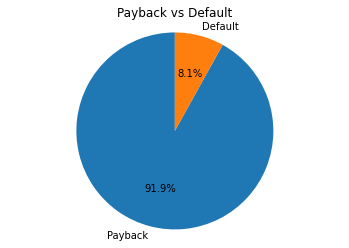

In [8]:
pb = len(payback.index)
df = len(default.index)
N = pb + df

labels = "Payback", "Default"
sizes = [pb/N,df/N]
title = "Payback vs Default"

arguments = [(labels, sizes, title)]

draw_piechart(arguments)

**Verhältnis Payback zu Default nach Geschlecht**

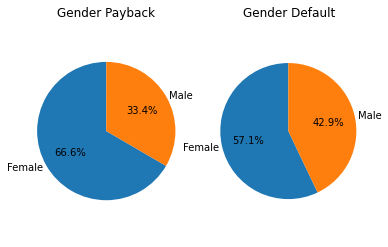

In [9]:
F,M,other = payback["CODE_GENDER"].value_counts()
N = F+M+other

labels1 = "Female", "Male"
sizes1 = [F/N,M/N]
title1 = "Gender Payback"

F,M = default["CODE_GENDER"].value_counts()
X = default["CODE_GENDER"].value_counts()

N = F+M

labels2 = "Female", "Male"
sizes2 = [F/N,M/N]
title2 = "Gender Default"

arguments = [(labels1, sizes1, title1),(labels2, sizes2, title2)]

draw_piechart(arguments)

**Verhältnis Payback zu Default nach Bildung**

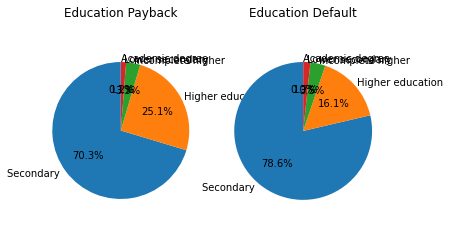

In [10]:
count = payback["NAME_EDUCATION_TYPE"].value_counts()

low_sec = count["Lower secondary"]
sec = count["Secondary / secondary special"]
inc_high = count["Incomplete higher"]
high = count["Higher education"]
acad = count["Academic degree"]

N = len(payback["NAME_EDUCATION_TYPE"])

labels1 = "Secondary ", "Higher education", "Incomplete higher", "Lower secondary", "Academic degree"
sizes1 = [sec/N, high/N, inc_high/N, low_sec/N, acad/N]
title1 = "Education Payback"

count = default["NAME_EDUCATION_TYPE"].value_counts()

low_sec = count["Lower secondary"]
sec = count["Secondary / secondary special"]
inc_high = count["Incomplete higher"]
high = count["Higher education"]
acad = count["Academic degree"]

N = len(default["NAME_EDUCATION_TYPE"])

labels2 = "Secondary ", "Higher education", "Incomplete higher", "Lower secondary", "Academic degree"
sizes2 = [sec/N, high/N, inc_high/N, low_sec/N, acad/N]
title2 = "Education Default"


arguments = [(labels1, sizes1, title1),(labels2, sizes2, title2)]

draw_piechart(arguments)

**Verhältnis Payback zu Default - komplette Liste der kategorischen Variablen**

In [ ]:
for head in n.columns.values:
    
    df1 = payback[head].value_counts().rename_axis(head).reset_index(name='payback').head()
    df2 = default[head].value_counts().rename_axis(head).reset_index(name='default').head()
    
    df1["payback"] = df1["payback"]/df1["payback"].sum()*100
    df2["default"] = df2["default"]/df2["default"].sum()*100
    
    df = df1.merge(df2, how="outer", on=head)
    
    df["change"] = (df["default"]-df["payback"])
    
    df = df.sort_values("change", ascending=False)
    
    display(df)

**Verhältnis Payback zu Default - Top-10 der unterschiedlichsten Verhältnisse**

In [11]:
top10 = []

for head in n.columns.values:
    
    df1 = payback[head].value_counts().rename_axis(head).reset_index(name='payback').head()
    df2 = default[head].value_counts().rename_axis(head).reset_index(name='default').head()
    
    df1["payback"] = df1["payback"]/df1["payback"].sum()*100
    df2["default"] = df2["default"]/df2["default"].sum()*100
    
    df = df1.merge(df2, how="outer", on=head)
    
    df["change"] = (df["default"]-df["payback"])
    
    df = df.sort_values("change", ascending=False)
    
    for element in df["change"]:
        if np.isnan(element):
            continue
        if len(top10) < 10:
            t = (head, df[df["change"]==element][head].values[0], element)    
            top10.append(t)
        else:
            if element > top10[-1][-1]:
                top10.pop(-1)
                t = (head, df[df["change"]==element][head].values[0], element)
                top10.append(t)
            
        top10 = sorted(top10, key=lambda value: value[2], reverse=True)

df = pd.DataFrame(top10)
display(df)

,0,1,2
0,NAME_INCOME_TYPE,Working,10.544642
1,CODE_GENDER,M,9.525086
2,NAME_EDUCATION_TYPE,Secondary / secondary special,8.297446
3,REG_CITY_NOT_WORK_CITY,1,7.883082
4,FLAG_DOCUMENT_3,1,7.386514
5,FLAG_EMP_PHONE,1,6.486361
6,REGION_RATING_CLIENT,3,6.416818
7,REGION_RATING_CLIENT_W_CITY,3,6.398668
8,OCCUPATION_TYPE,Laborers,6.329470
9,ORGANIZATION_TYPE,Business Entity Type 3,5.712701


Eine zahlungsunfähige Person ist typischerweise:

    - arbeitend
    - männlich
    - Bildungsniveau Sekundarstufe
    - hat eine weitere Adresse für die Arbeit hinterlegt
    - ...

**Pearson Correlation**

**Korrelaion aller Features des Trainingsdatensatzes**

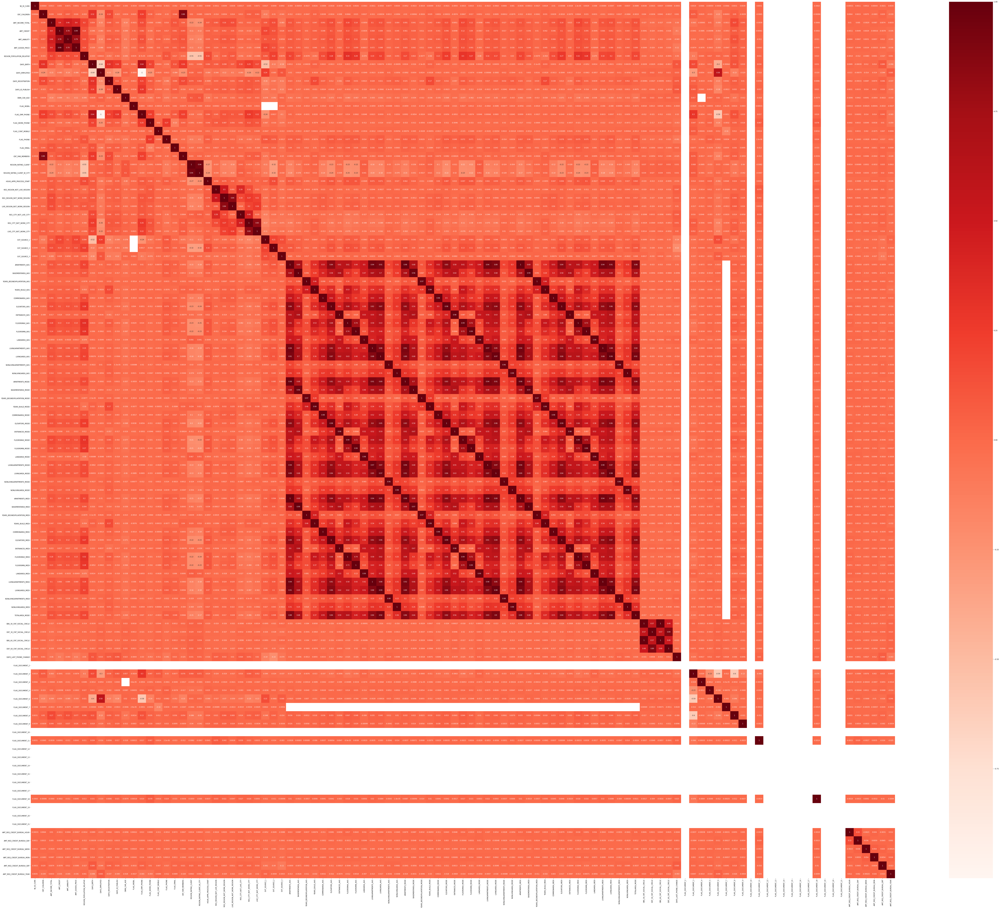

In [19]:
plt.figure(figsize=(120,100))
sns.heatmap(app_test.corr(), annot=True, cmap=plt.cm.Reds)
plt.show()

**Korrelation der Features der zurückzahlenden Personen**

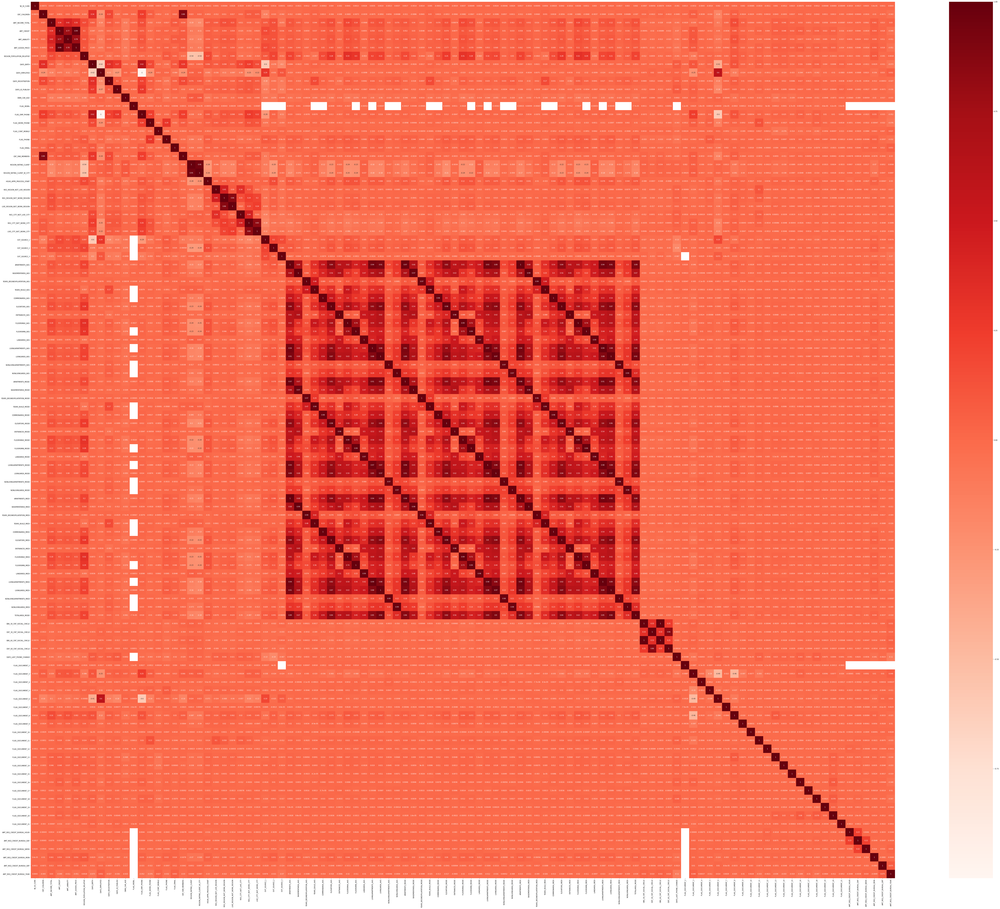

In [20]:
plt.figure(figsize=(120,100))
sns.heatmap(payback.corr(), annot=True, cmap=plt.cm.Reds)
plt.show()

**Korrelation der Features der ausfallenden Personen**

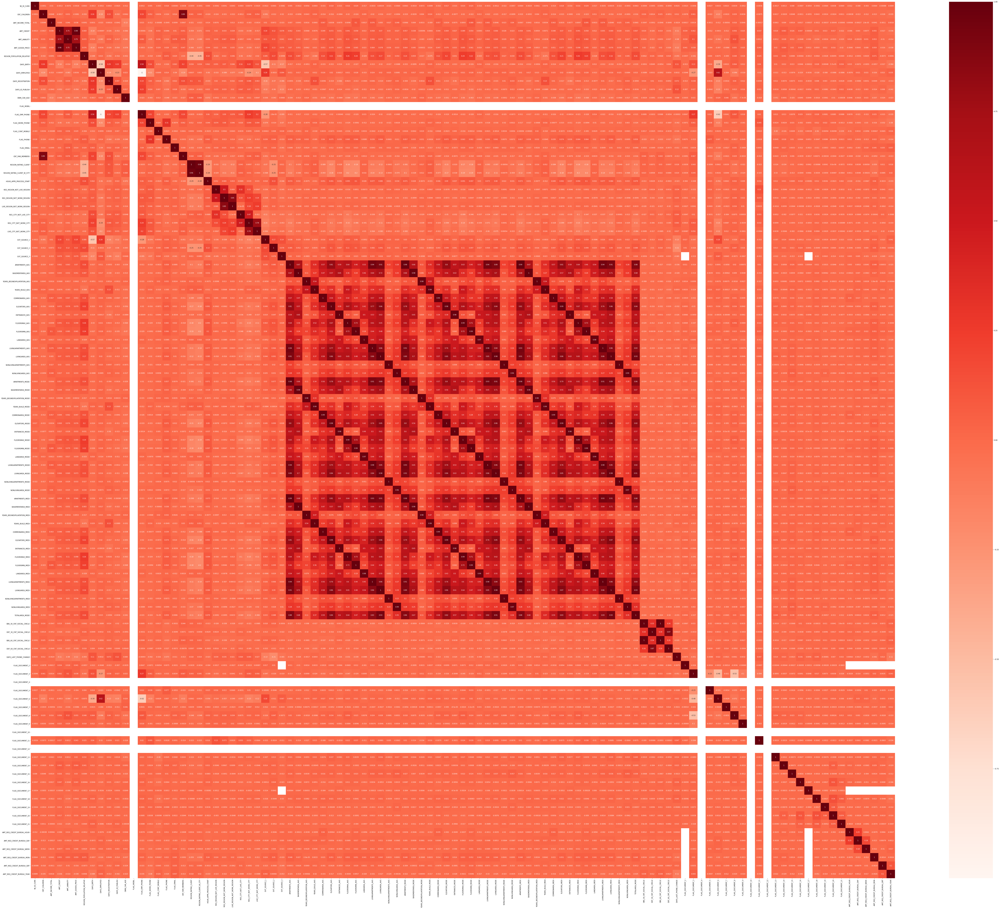

In [21]:
plt.figure(figsize=(120,100))
sns.heatmap(default.corr(), annot=True, cmap=plt.cm.Reds)
plt.show()

**Numerische Werte**

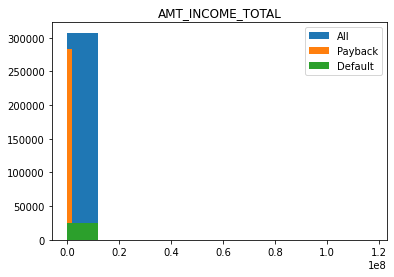

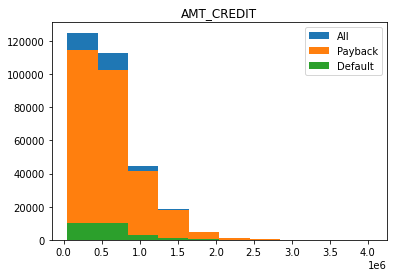

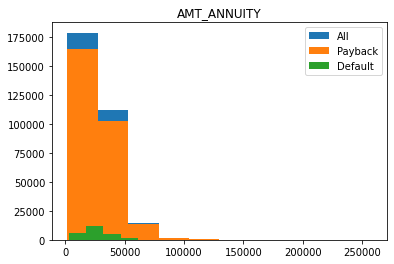

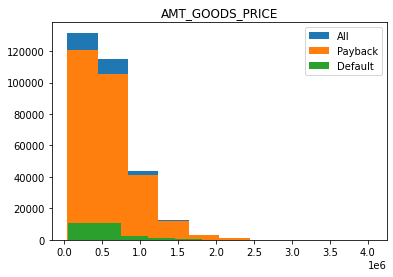

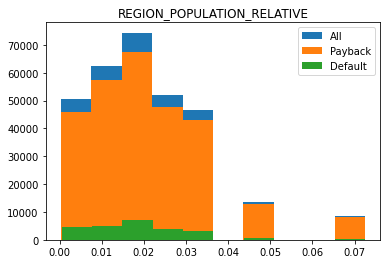

...

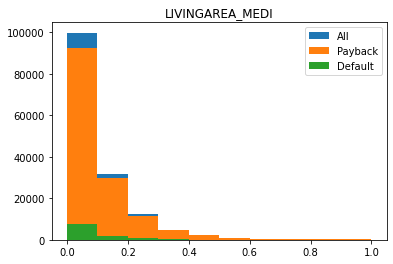

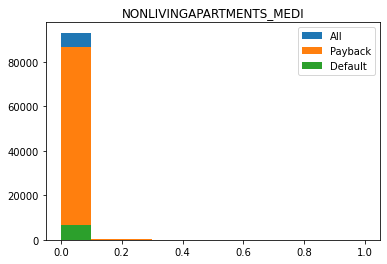

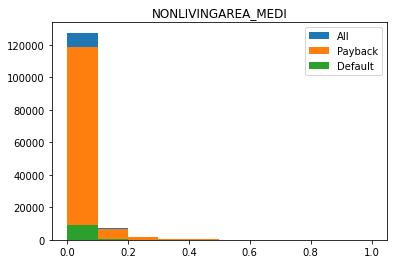

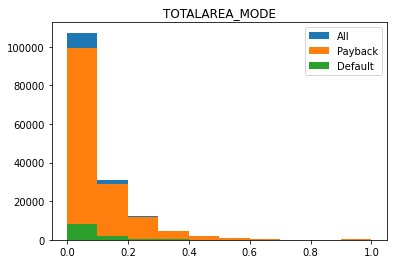

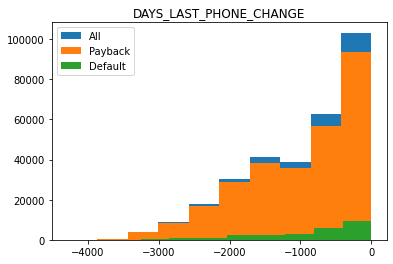

In [17]:
for head in ms.columns.values:
    plt.hist(ms[head])
    plt.hist(msp[head])
    plt.hist(msd[head])
    plt.legend(labels=["All", "Payback","Default"])
    plt.title(head)
    plt.show()

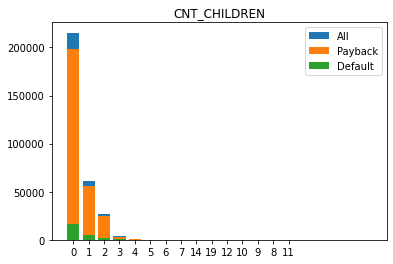

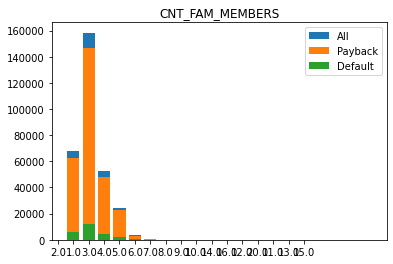

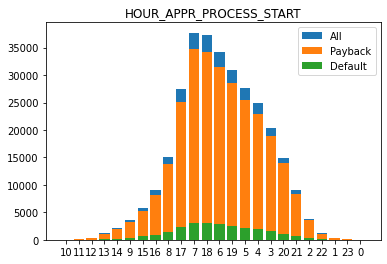

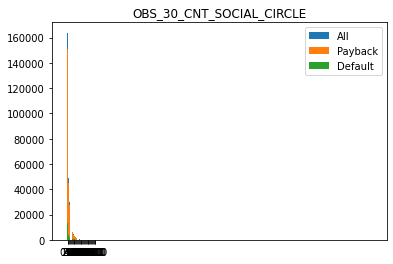

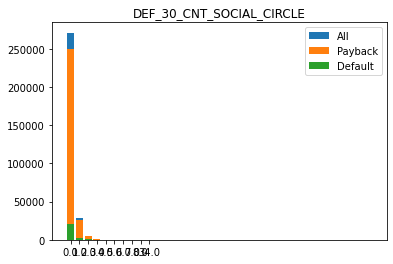

...

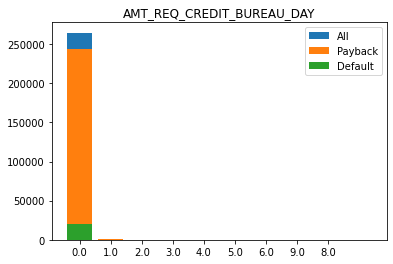

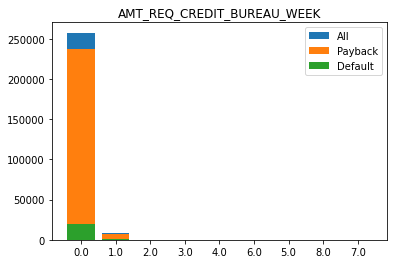

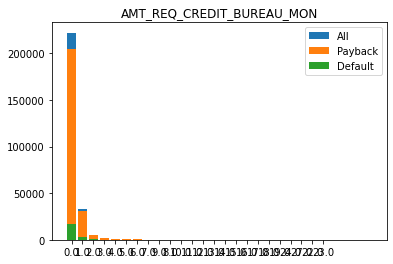

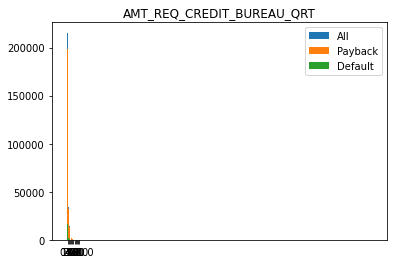

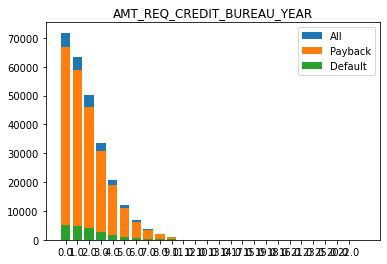

In [18]:
for head in md.columns.values:
    bins = md[head].value_counts()
    bins1 = mdp[head].value_counts()
    bins2 = mdd[head].value_counts()

    fig, ax = plt.subplots()
    ax.bar(bins.keys(), bins.values, label='All')
    ax.bar(bins1.keys(), bins1.values, label='Payback')
    ax.bar(bins2.keys(), bins2.values, label='Default')
    
    plt.xticks(np.arange(len(bins.keys())), bins.keys())
    
    plt.title(head)
    plt.legend()
    plt.show()